In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import re

df=pd.read_excel("detection_result.xlsx")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 24 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Unnamed: 0                 2000 non-null   int64  
 1   paragraphs                 2000 non-null   object 
 2   completely_generated_prob  2000 non-null   float64
 3   average_generated_prob     2000 non-null   float64
 4   predicted_class            2000 non-null   object 
 5   confidence_score           2000 non-null   float64
 6   confidence_category        2000 non-null   object 
 7   overall_burstiness         2000 non-null   int64  
 8   writing_stats              2000 non-null   object 
 9   confidence_thresholds_raw  2000 non-null   object 
 10  sentences                  2000 non-null   object 
 11  class_probabilities        2000 non-null   object 
 12  confidence_scores_raw      2000 non-null   object 
 13  subclass                   2000 non-null   objec

In [5]:
df.columns

Index(['Unnamed: 0', 'paragraphs', 'completely_generated_prob',
       'average_generated_prob', 'predicted_class', 'confidence_score',
       'confidence_category', 'overall_burstiness', 'writing_stats',
       'confidence_thresholds_raw', 'sentences', 'class_probabilities',
       'confidence_scores_raw', 'subclass', 'pageNumber', 'neatVersion',
       'version', 'language', 'result_message', 'result_sub_message',
       'document_classification', 'inputText', 'document_id', 'true_label'],
      dtype='object')

In [6]:
import string

# 创建转换表
def create_translation_table():
    # 中文标点
    chinese_punctuation = '，。！？；："「」『』《》【】（）〔〕…—～`·'
    # 英文标点
    english_punctuation = string.punctuation
    # 空格
    whitespace = ' \t\n\r\x0b\x0c'
    
    # 所有要删除的字符
    chars_to_remove = chinese_punctuation + english_punctuation + whitespace
    
    # 创建转换表：每个字符映射到 None
    translation_table = str.maketrans('', '', chars_to_remove)
    return translation_table

translation_table = create_translation_table()

df['input_text_clean'] = df['inputText'].apply(
    lambda x: str(x).translate(translation_table) if pd.notnull(x) else ''
)

In [7]:
# 计算每行 input_text 的字符长度
df['text_length_chars'] = df['input_text_clean'].str.len()

print("字符长度统计:")
print(df['text_length_chars'].describe())

字符长度统计:
count    2000.000000
mean      772.234000
std       307.975752
min       268.000000
25%       614.000000
50%       726.000000
75%       857.000000
max      8475.000000
Name: text_length_chars, dtype: float64


In [9]:
# 计算每行 input_text 的句子数量（按句号、问号、感叹号分割）

def count_sentences(text):
    if isinstance(text, str):
        # 使用正则表达式分割句子
        sentences = re.split(r'[。！？]+', text)
        # 过滤空字符串
        sentences = [s.strip() for s in sentences if s.strip()]
        return len(sentences)
    return 0

df['text_length_sentences'] = df['inputText'].apply(count_sentences)

print("一条报告的句子数量:")
print(df['text_length_sentences'].describe())

一条报告的句子数量:
count    2000.000000
mean       16.287000
std         6.090335
min         2.000000
25%        13.000000
50%        16.000000
75%        19.000000
max       164.000000
Name: text_length_sentences, dtype: float64


In [10]:
df["average_generated_prob"].describe()

count    2000.000000
mean        0.710452
std         0.439663
min         0.000000
25%         0.025987
50%         1.000000
75%         1.000000
max         1.000000
Name: average_generated_prob, dtype: float64

In [19]:
import plotly.express as px

fig = px.histogram(df, x='text_length_sentences', 
                   title='Distribution of Sentence Number',
                   nbins=20,
                   opacity=0.7)

# # 自定义颜色
# fig.update_traces(marker=dict(
#     color=df['completely_generated_prob'],  # 根据数值着色
#     colorscale='Hot',  # 使用热力图颜色尺度
#     showscale=True     # 显示颜色栏
# ))

fig.update_layout(
    xaxis_title='Number of Sentences',
    yaxis_title='Frequency',
    bargap=0.1,
    width=800,
    height=500,
    xaxis=dict(range=[0,60])
)

fig.show()

In [20]:
df.columns

Index(['Unnamed: 0', 'paragraphs', 'completely_generated_prob',
       'average_generated_prob', 'predicted_class', 'confidence_score',
       'confidence_category', 'overall_burstiness', 'writing_stats',
       'confidence_thresholds_raw', 'sentences', 'class_probabilities',
       'confidence_scores_raw', 'subclass', 'pageNumber', 'neatVersion',
       'version', 'language', 'result_message', 'result_sub_message',
       'document_classification', 'inputText', 'document_id', 'true_label',
       'input_text_clean', 'text_length_chars', 'text_length_sentences'],
      dtype='object')

In [21]:
df['input_text_clean'][0].split()

['公司发布年度业绩预增公告表现亮眼预计全年实现归母净利润亿元同比增长其中第四季度单季实现归母净利润亿元同比增长按预测中枢计算年预计实现归母净利润亿元同比增长Q预计实现归母净利润亿元同比增长加速推进智能制造升级产能利用率持续优化智能工厂建设成效显著Q新增条自动化生产线整体产能提升单位生产成本同比下降数字化管理系统全面上线生产周期缩短订单交付准时率提升至客户满意度大幅提高技术研发成果丰硕高端产品占比提升公司依托国家级技术中心优势持续加大研发投入Q研发费用同比增长新一代智能家居系列产品市场反响热烈其中智能安防系统销售额同比增长高端产品营收占比提升至产品结构优化推动毛利率稳步提升Q毛利率同比pct至Q毛利率同比pct至供应链管理持续优化运营效率显著提升通过建立智能化仓储物流体系库存周转天数减少天应收账款周转率提升至次经营性现金流同比增长短期来看公司智能制造转型成效显著高端产品放量叠加成本管控优势推动业绩超预期增长长期而言公司深耕智能家居赛道持续完善产业布局通过技术创新与渠道拓展双轮驱动未来发展空间广阔我们上调年归母净利润预测至原值为亿元同比当前股价对应年PE分别为倍维持强烈推荐评级风险提示行业竞争加剧风险原材料价格波动风险']

In [22]:
df.columns

Index(['Unnamed: 0', 'paragraphs', 'completely_generated_prob',
       'average_generated_prob', 'predicted_class', 'confidence_score',
       'confidence_category', 'overall_burstiness', 'writing_stats',
       'confidence_thresholds_raw', 'sentences', 'class_probabilities',
       'confidence_scores_raw', 'subclass', 'pageNumber', 'neatVersion',
       'version', 'language', 'result_message', 'result_sub_message',
       'document_classification', 'inputText', 'document_id', 'true_label',
       'input_text_clean', 'text_length_chars', 'text_length_sentences'],
      dtype='object')

In [24]:
# 一次性计算多种长度指标
df['char_length'] = df['input_text_clean'].str.len()
df['word_count'] = df['input_text_clean'].str.split().str.len()
df['sentence_count'] = df['inputText'].apply(count_sentences)

# 计算平均单词长度
df['avg_word_length'] = df['char_length'] / df['word_count']
df['avg_word_length'] = df['avg_word_length'].replace([float('inf'), -float('inf')], 0).fillna(0)

print("综合长度统计:")
print(df[['char_length', 'word_count', 'sentence_count', 'avg_word_length']].describe())

综合长度统计:
       char_length   word_count  sentence_count  avg_word_length
count  2000.000000  2000.000000     2000.000000      2000.000000
mean    772.234000     3.194500       16.287000       546.947700
std     307.975752     4.350992        6.090335       318.856477
min     268.000000     1.000000        2.000000        48.214286
25%     614.000000     1.000000       13.000000       165.487500
50%     726.000000     1.000000       16.000000       609.500000
75%     857.000000     6.000000       19.000000       748.000000
max    8475.000000    91.000000      164.000000      2554.000000


In [25]:
print("综合长度统计:")
desc = df[['char_length', 'word_count', 'sentence_count', 'avg_word_length']].describe().round(1)
print(desc)

综合长度统计:
       char_length  word_count  sentence_count  avg_word_length
count       2000.0      2000.0          2000.0           2000.0
mean         772.2         3.2            16.3            546.9
std          308.0         4.4             6.1            318.9
min          268.0         1.0             2.0             48.2
25%          614.0         1.0            13.0            165.5
50%          726.0         1.0            16.0            609.5
75%          857.0         6.0            19.0            748.0
max         8475.0        91.0           164.0           2554.0


In [26]:
import nltk
# 如果尚未下载 punkt，需要先运行: nltk.download('punkt')

from nltk.tokenize import sent_tokenize

def count_sentences_nltk(text):
    if isinstance(text, str):
        try:
            sentences = sent_tokenize(text)
            return len(sentences)
        except:
            return 0
    return 0

df['sentence_count_nltk'] = df['input_text'].apply(count_sentences_nltk)

KeyError: 'input_text'

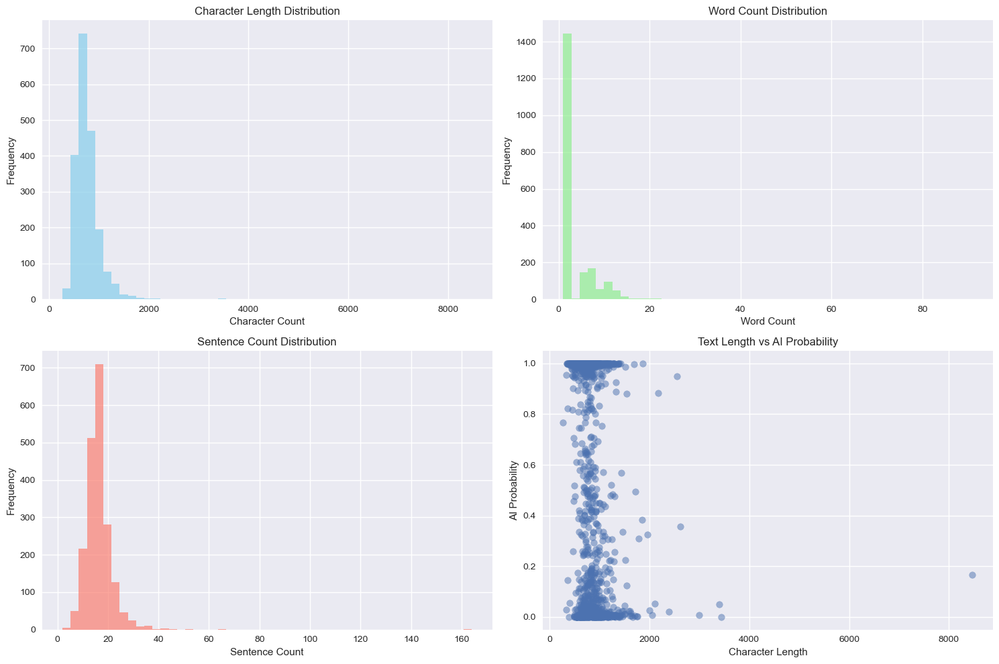

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

# 设置图表风格
plt.style.use('seaborn-v0_8')
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# 字符长度分布
axes[0,0].hist(df['char_length'], bins=50, alpha=0.7, color='skyblue')
axes[0,0].set_title('Character Length Distribution')
axes[0,0].set_xlabel('Character Count')
axes[0,0].set_ylabel('Frequency')

# 单词数量分布
axes[0,1].hist(df['word_count'], bins=50, alpha=0.7, color='lightgreen')
axes[0,1].set_title('Word Count Distribution')
axes[0,1].set_xlabel('Word Count')
axes[0,1].set_ylabel('Frequency')

# 句子数量分布
axes[1,0].hist(df['sentence_count'], bins=50, alpha=0.7, color='salmon')
axes[1,0].set_title('Sentence Count Distribution')
axes[1,0].set_xlabel('Sentence Count')
axes[1,0].set_ylabel('Frequency')

# 长度与AI概率的关系
axes[1,1].scatter(df['char_length'], df['completely_generated_prob'], alpha=0.5)
axes[1,1].set_title('Text Length vs AI Probability')
axes[1,1].set_xlabel('Character Length')
axes[1,1].set_ylabel('AI Probability')

plt.tight_layout()
plt.show()

In [28]:
grouped=df.groupby("document_classification")
grouped

print(df['document_classification'].value_counts())

document_classification
AI_ONLY       1377
HUMAN_ONLY     623
Name: count, dtype: int64


In [30]:
df[df["document_classification"]=='AI_ONLY']['inputText']

0       公司发布年度业绩预增公告，表现亮眼。预计全年实现归母净利润亿元，同比增长；其中第四季度单季实...
1       核心观点：\n公司深耕光伏逆变器领域近二十载，储能系统集成业务构筑第二增长引擎。企业自年成立...
2       公司近况\n年国内光伏新增装机量约GW（CPIA统计），我们预计年有望达到GW，晶澳科技有望...
3       核心观点：\n公司持续深化碳纤维复合材料在航空航天领域的战略布局。根据上交所e互动平台披露，...
4       事件：拟募集不超过亿元，用于高端功率半导体器件产线扩建及技术升级。  \n月日公司发布《年度...
                              ...                        
1949    　　全面布局电缆连接行业，下游应用广泛。公司产品覆盖数据电缆专用电缆和连接产品等，应用布局包...
1961    　　事件：月日，公司披露业绩预告，预计年前三季度实现归母净利润亿元，同比+；扣非归母净利润亿...
1976        本报告导读：_D_\n    公司发布股权激励，激励目标锚定高质量增长，上调公司估值...
1979    　　公司近况_D_\n　　 月 日，公司发布关于签订日常经营重大合同的公告：公司及下属子公司...
1984    　　公司发布 年限制性股票激励计划（草案）_D_\n\t公司拟向核心管理人员及核心技术人员共...
Name: inputText, Length: 1377, dtype: object

In [31]:
df['sentences'][0]

'[{\'generated_prob\': 0.9997933701777411, \'sentence\': \'公司发布年度业绩预增公告，表现亮眼。\', \'perplexity\': 0, \'class_probabilities\': {\'human\': 0.00020662982225902254, \'ai\': 0.9997933692632986, \'paraphrased\': 9.144423721527371e-10}, \'interpretability_value\': None, \'interpretability_normalized_value\': None, \'interpretability_designation\': None, \'interpretability_alpha\': None, \'highlight_sentence_for_ai\': True, \'special_highlight_type\': None}, {\'generated_prob\': 0.9997997262378683, \'sentence\': \'预计全年实现归母净利润亿元，同比增长；其中第四季度单季实现归母净利润亿元，同比增长。\', \'perplexity\': 0, \'class_probabilities\': {\'human\': 0.00020027376213168906, \'ai\': 0.9997997253515547, \'paraphrased\': 8.863135780611193e-10}, \'interpretability_value\': None, \'interpretability_normalized_value\': None, \'interpretability_designation\': None, \'interpretability_alpha\': None, \'highlight_sentence_for_ai\': True, \'special_highlight_type\': None}, {\'generated_prob\': 0.9997730661316144, \'sentence\': \'按预测中枢计算，年预计

In [32]:
a=df.iloc[0]['sentences']
a

'[{\'generated_prob\': 0.9997933701777411, \'sentence\': \'公司发布年度业绩预增公告，表现亮眼。\', \'perplexity\': 0, \'class_probabilities\': {\'human\': 0.00020662982225902254, \'ai\': 0.9997933692632986, \'paraphrased\': 9.144423721527371e-10}, \'interpretability_value\': None, \'interpretability_normalized_value\': None, \'interpretability_designation\': None, \'interpretability_alpha\': None, \'highlight_sentence_for_ai\': True, \'special_highlight_type\': None}, {\'generated_prob\': 0.9997997262378683, \'sentence\': \'预计全年实现归母净利润亿元，同比增长；其中第四季度单季实现归母净利润亿元，同比增长。\', \'perplexity\': 0, \'class_probabilities\': {\'human\': 0.00020027376213168906, \'ai\': 0.9997997253515547, \'paraphrased\': 8.863135780611193e-10}, \'interpretability_value\': None, \'interpretability_normalized_value\': None, \'interpretability_designation\': None, \'interpretability_alpha\': None, \'highlight_sentence_for_ai\': True, \'special_highlight_type\': None}, {\'generated_prob\': 0.9997730661316144, \'sentence\': \'按预测中枢计算，年预计

In [33]:
import ast
ast.literal_eval(df.iloc[0]['sentences'])[0].get('sentence')

'公司发布年度业绩预增公告，表现亮眼。'

In [34]:
import ast

expanded_rows = []

for i, row in df.iterrows():
    try:
        # 用 ast.literal_eval 把字符串解析为 Python 对象（比 eval 安全）
        sentences = ast.literal_eval(row['sentences'])
    except Exception:
        continue
    
    if not isinstance(sentences, list):
        continue
    
    for j, s in enumerate(sentences):
        expanded_rows.append({
            "doc_index": i,
            "sentence_index": j,
            "sentence": s.get("sentence", ""),
            "generated_prob": float(s.get("generated_prob", np.nan)),
            "perplexity": float(s.get("perplexity", np.nan)),
            "human_prob": float(s.get("class_probabilities", {}).get("human", np.nan)),
            "ai_prob": float(s.get("class_probabilities", {}).get("ai", np.nan)),
            "char_len": len(s.get("sentence", "")),
            "word_count": len(s.get("sentence", "").split())
        })

sent_df = pd.DataFrame(expanded_rows)

print(sent_df.head())
print(sent_df.describe())


   doc_index  sentence_index  \
0          0               0   
1          0               1   
2          0               2   
3          0               3   
4          0               4   

                                            sentence  generated_prob  \
0                                 公司发布年度业绩预增公告，表现亮眼。        0.999793   
1         预计全年实现归母净利润亿元，同比增长；其中第四季度单季实现归母净利润亿元，同比增长。        0.999800   
2       按预测中枢计算，年预计实现归母净利润亿元，同比增长；Q预计实现归母净利润亿元，同比增长。        0.999773   
3                             加速推进智能制造升级，产能利用率持续优化。）        0.999768   
4  智能工厂建设成效显著：Q新增条自动化生产线，整体产能提升，单位生产成本同比下降；）数字化管理...        0.999806   

   perplexity  human_prob   ai_prob  char_len  word_count  
0         0.0    0.000207  0.999793        18           1  
1         0.0    0.000200  0.999800        42           1  
2         0.0    0.000227  0.999773        44           1  
3         0.0    0.000232  0.999768        22           1  
4         0.0    0.000194  0.999806        81           1  
          doc_

In [35]:
sent_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41853 entries, 0 to 41852
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   doc_index       41853 non-null  int64  
 1   sentence_index  41853 non-null  int64  
 2   sentence        41853 non-null  object 
 3   generated_prob  41853 non-null  float64
 4   perplexity      41853 non-null  float64
 5   human_prob      41853 non-null  float64
 6   ai_prob         41853 non-null  float64
 7   char_len        41853 non-null  int64  
 8   word_count      41853 non-null  int64  
dtypes: float64(4), int64(4), object(1)
memory usage: 2.9+ MB


In [43]:
import plotly.express as px

fig = px.scatter(
    sent_df, 
    x="word_count", 
    y="generated_prob", 
    size="word_count",
    color="true_label",
    hover_data=["sentence"],
    title="Sentence Length vs AI Probability"
)
fig.update_layout(width=600, height=400)
fig.show()

In [44]:
fig = px.scatter(
    sent_df,
    x="char_len",
    y="generated_prob",
    color="true_label",
    hover_data=["sentence"],
    title="Perplexity vs AI Probability"
)
fig.update_layout(width=600, height=400)
fig.show()


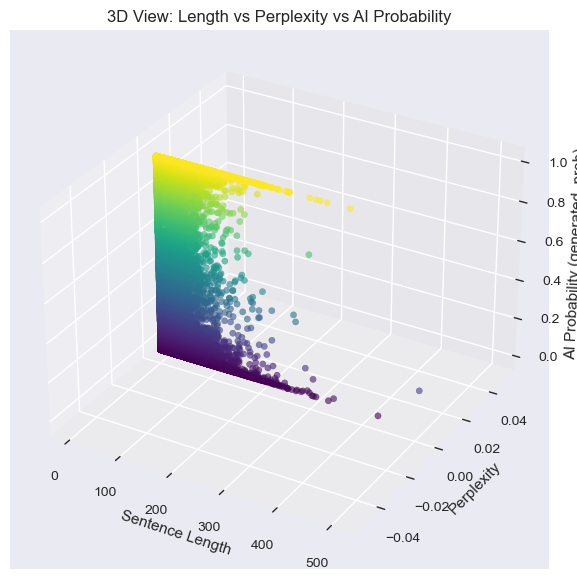

In [46]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(
    sent_df["char_len"],
    sent_df["perplexity"],
    sent_df["generated_prob"],
    c=sent_df["generated_prob"],
    cmap="viridis",
    alpha=0.6
)

ax.set_xlabel("Sentence Length")
ax.set_ylabel("Perplexity")
ax.set_zlabel("AI Probability (generated_prob)")
ax.set_title("3D View: Length vs Perplexity vs AI Probability")

plt.show()


In [47]:
df.columns

Index(['Unnamed: 0', 'paragraphs', 'completely_generated_prob',
       'average_generated_prob', 'predicted_class', 'confidence_score',
       'confidence_category', 'overall_burstiness', 'writing_stats',
       'confidence_thresholds_raw', 'sentences', 'class_probabilities',
       'confidence_scores_raw', 'subclass', 'pageNumber', 'neatVersion',
       'version', 'language', 'result_message', 'result_sub_message',
       'document_classification', 'inputText', 'document_id', 'true_label',
       'input_text_clean', 'text_length_chars', 'text_length_sentences',
       'char_length', 'word_count', 'sentence_count', 'avg_word_length'],
      dtype='object')

In [48]:
df['sentence_count_nltk'].max()

KeyError: 'sentence_count_nltk'

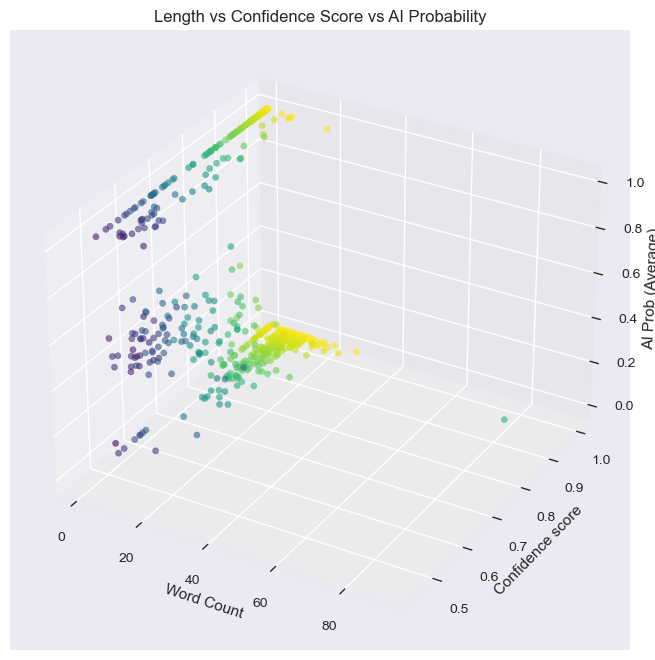

In [49]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(8, 10))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df["word_count"], df["confidence_score"], df["average_generated_prob"],c=df["confidence_score"], cmap="viridis", alpha=0.6)

ax.set_xlabel("Word Count")
ax.set_ylabel("Confidence score")
ax.set_zlabel("AI Prob (Average)")
ax.set_title("Length vs Confidence Score vs AI Probability")

plt.show()


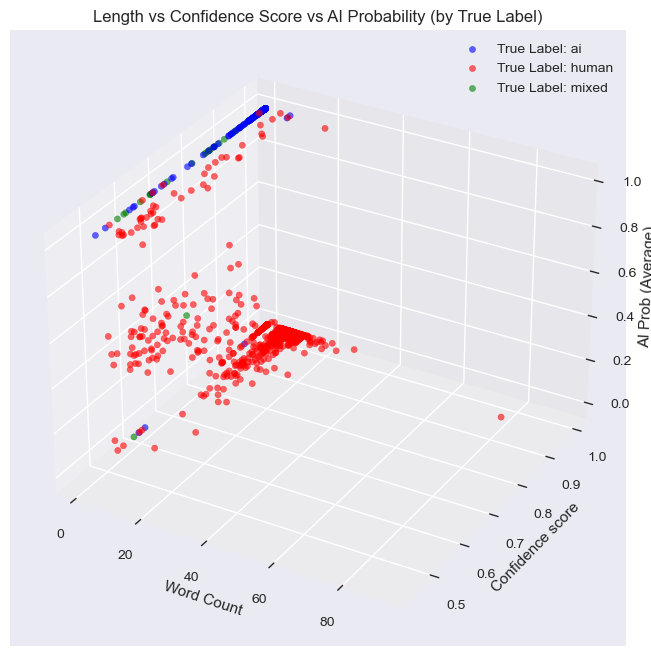

In [51]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# 为不同的 true_label 分配不同颜色
colors = ['blue', 'red', 'green', 'orange', 'purple']  # 根据需要添加更多颜色
unique_labels = sorted(df['true_label'].unique())

for i, label in enumerate(unique_labels):
    mask = df['true_label'] == label
    ax.scatter(df[mask]["word_count"], 
               df[mask]["confidence_score"], 
               df[mask]["average_generated_prob"],
               c=colors[i % len(colors)], 
               label=f'True Label: {label}',
               alpha=0.6)

ax.set_xlabel("Word Count")
ax.set_ylabel("Confidence score")
ax.set_zlabel("AI Prob (Average)")
ax.set_title("Length vs Confidence Score vs AI Probability (by True Label)")
ax.legend()

plt.show()

In [63]:
fig = px.histogram(
    sent_df,
    x="word_count",
    y="generated_prob",
    histfunc="avg",
    nbins=50,
    title="Average AI Probability across Sentence Lengths"
)
fig.update_layout(width=600, height=400)
fig.update_traces(marker=dict(color='green'))
fig.show()


In [64]:

fig = px.scatter(
    sent_df, 
    x="char_len", 
    y="ai_prob",
    size="word_count",
    color="human_prob",
    hover_data=["sentence"],
    title="Sentence Length vs AI Probability"
)
fig.update_layout(width=600, height=400)
fig.show()


In [65]:
fig = px.histogram(
    sent_df,
    x="word_count",
    color=(sent_df["ai_prob"] > 0.5),
    nbins=50,
    title="Sentence Length Distribution (AI-prob > 0.5 vs Human)"
)
fig.update_layout(width=600, height=400)
fig.show()


In [66]:
sent_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 561 entries, 0 to 560
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   doc_index       561 non-null    int64  
 1   sentence_index  561 non-null    int64  
 2   sentence        561 non-null    object 
 3   generated_prob  561 non-null    float64
 4   perplexity      561 non-null    float64
 5   human_prob      561 non-null    float64
 6   ai_prob         561 non-null    float64
 7   char_len        561 non-null    int64  
 8   word_count      561 non-null    int64  
dtypes: float64(4), int64(4), object(1)
memory usage: 39.6+ KB


In [67]:
import plotly.express as px

fig = px.scatter_3d(
    df,
    x='completely_generated_prob',
    y='average_generated_prob',
    z='confidence_score',
    color='confidence_score',   # 用颜色表示置信度
    hover_data=['input_text'],   # 悬停显示原文
    title='3D Scatter of AI Detection Probabilities'
)

fig.update_layout(
    scene=dict(
        xaxis_title='Completely Generated Prob',
        yaxis_title='Average Generated Prob',
        zaxis_title='Confidence Score'
    )
)

fig.show()

In [68]:
df

,Unnamed: 0,paragraphs,completely_generated_prob,average_generated_prob,predicted_class,confidence_score,confidence_category,overall_burstiness,writing_stats,confidence_thresholds_raw,...,input_text,document_id,input_text_clean,text_length_chars,text_length_sentences,char_length,word_count,sentence_count,avg_word_length,sentence_count_nltk
0,0,"[{'start_sentence_index': 0, 'num_sentences': ...",0.998291,1.0,ai,0.998334,high,0,{},"{'identity': {'ai': {'reject': 0.33, 'low': 0....",...,### Conclusion and Investment Recommendation\n...,fa76bfe0-54b0-498d-82e3-b428ee326c96,ConclusionandInvestmentRecommendationInsummary...,1426,1,1426,1,1,1426.0,0
1,0,"[{'start_sentence_index': 0, 'num_sentences': ...",0.995038,1.0,ai,0.995038,high,0,{},"{'identity': {'ai': {'reject': 0.33, 'low': 0....",...,### 结论与投资建议\n\n总体而言，我们认为XYZ科技公司（XYZUS）在当前市场环境下...,3e6383c1-47e7-4f16-b077-7d79318f8457,结论与投资建议总体而言我们认为XYZ科技公司XYZUS在当前市场环境下具备强劲的增长潜力公司...,415,12,415,1,12,415.0,0
2,0,"[{'start_sentence_index': 0, 'num_sentences': ...",0.978285,1.0,ai,0.978285,high,0,{},"{'identity': {'ai': {'reject': 0.33, 'low': 0....",...,### 投资结论\n\n综上所述，我们认为XYZ公司（股票代码：XYZUS）在当前市场环境下...,cf2dfd38-436d-429b-bfc3-15ab038343fa,投资结论综上所述我们认为XYZ公司股票代码XYZUS在当前市场环境下具备强劲的增长潜力公司受...,299,11,299,1,11,299.0,0
3,0,"[{'start_sentence_index': 0, 'num_sentences': ...",0.991001,1.0,ai,0.991001,high,0,{},"{'identity': {'ai': {'reject': 0.33, 'low': 0....",...,### 结论与投资建议\n\n综上所述，我们认为XYZ科技股份有限公司（以下简称“XYZ”）...,0ce60b3d-d766-4436-a306-3139c02925c6,结论与投资建议综上所述我们认为XYZ科技股份有限公司以下简称“XYZ”在当前市场环境下具备强...,450,12,450,1,12,450.0,0
4,0,"[{'start_sentence_index': 0, 'num_sentences': ...",0.763386,1.0,ai,0.763386,medium,0,{},"{'identity': {'ai': {'reject': 0.33, 'low': 0....",...,### 结论与投资建议\n\n我们维持对腾讯控股（HK）的“买入”评级，并将个月目标价上调至...,d4e58ff0-8931-4b56-846d-14d28ca4d117,结论与投资建议我们维持对腾讯控股HK的“买入”评级并将个月目标价上调至HK基于DCF模型隐含...,312,10,312,1,10,312.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,0,"[{'start_sentence_index': 0, 'num_sentences': ...",0.960283,1.0,ai,0.960283,high,0,{},"{'identity': {'ai': {'reject': 0.33, 'low': 0....",...,### 结论与投资建议\n\n总体而言，我们认为TechCorp（股票代码：TECH）在当前...,38057c16-5c79-4c9c-a590-19c79ad0194c,结论与投资建议总体而言我们认为TechCorp股票代码TECH在当前市场环境中具备强劲的增长...,415,12,415,1,12,415.0,0
65,0,"[{'start_sentence_index': 0, 'num_sentences': ...",0.927185,1.0,ai,0.927185,high,0,{},"{'identity': {'ai': {'reject': 0.33, 'low': 0....",...,### 结论\n\n我们维持对公司股票的“买入”评级，并将个月目标价上调至人民币元（基于DC...,ba1078f8-f484-49a2-9ddd-e7f73c82a2fb,结论我们维持对公司股票的“买入”评级并将个月目标价上调至人民币元基于DCF模型隐含财年EVE...,493,15,493,1,15,493.0,0
66,0,"[{'start_sentence_index': 0, 'num_sentences': ...",0.989488,1.0,ai,0.989488,high,0,{},"{'identity': {'ai': {'reject': 0.33, 'low': 0....",...,### 投资结论与推荐\n\n基于我们对XYZ科技公司（XYZ US）的全面分析，我们维持对...,87a5c2bd-9680-453d-81e9-ce18323256e3,投资结论与推荐基于我们对XYZ科技公司XYZUS的全面分析我们维持对该股的“买入”评级XYZ...,366,9,366,1,9,366.0,0
67,0,"[{'start_sentence_index': 0, 'num_sentences': ...",0.952274,1.0,ai,0.952274,high,0,{},"{'identity': {'ai': {'reject': 0.33, 'low': 0....",...,### 投资结论\n\n我们维持对腾讯控股（HK）的“买入”评级，并将个月目标价上调至HK$...,fd3d8ccb-cc5e-4059-83b5-2597d81a6243,投资结论我们维持对腾讯控股HK的“买入”评级并将个月目标价上调至HK基于DCF估值模型和同业...,306,9,306,1,9,306.0,0


In [69]:
# 先在 df 中初始化新列
df['total_sentence_length'] = 0

# 遍历每条原始段落
for paragraph in df['paragraphs'].unique():
    # 找出属于这个段落的所有行
    mask = df['paragraphs'] == paragraph
    sub_df = df[mask]
    
    # 累加句子长度
    total_length = 0
    for sentence in sub_df['sentences']:
        total_length += len(sentence)  # 字符长度，可以改 len(sentence.split()) 求词数
    
    # 把结果赋给这一段落对应的所有行
    df.loc[mask, 'total_sentence_length'] = total_length

print(df.head())


   Unnamed: 0                                         paragraphs  \
0           0  [{'start_sentence_index': 0, 'num_sentences': ...   
1           0  [{'start_sentence_index': 0, 'num_sentences': ...   
2           0  [{'start_sentence_index': 0, 'num_sentences': ...   
3           0  [{'start_sentence_index': 0, 'num_sentences': ...   
4           0  [{'start_sentence_index': 0, 'num_sentences': ...   

   completely_generated_prob  average_generated_prob predicted_class  \
0                   0.998291                     1.0              ai   
1                   0.995038                     1.0              ai   
2                   0.978285                     1.0              ai   
3                   0.991001                     1.0              ai   
4                   0.763386                     1.0              ai   

   confidence_score confidence_category  overall_burstiness writing_stats  \
0          0.998334                high                   0            {}   
1   

In [73]:
df.columns

Index(['Unnamed: 0', 'paragraphs', 'completely_generated_prob',
       'average_generated_prob', 'predicted_class', 'confidence_score',
       'confidence_category', 'overall_burstiness', 'writing_stats',
       'confidence_thresholds_raw', 'sentences', 'class_probabilities',
       'confidence_scores_raw', 'subclass', 'pageNumber', 'neatVersion',
       'version', 'language', 'result_message', 'result_sub_message',
       'document_classification', 'input_text', 'document_id',
       'input_text_clean', 'text_length_chars', 'text_length_sentences',
       'char_length', 'word_count', 'sentence_count', 'avg_word_length',
       'sentence_count_nltk', 'total_sentence_length'],
      dtype='object')

In [72]:
df.info()

df['sentence_length']

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69 entries, 0 to 68
Data columns (total 32 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Unnamed: 0                 69 non-null     int64  
 1   paragraphs                 69 non-null     object 
 2   completely_generated_prob  69 non-null     float64
 3   average_generated_prob     69 non-null     float64
 4   predicted_class            69 non-null     object 
 5   confidence_score           69 non-null     float64
 6   confidence_category        69 non-null     object 
 7   overall_burstiness         69 non-null     int64  
 8   writing_stats              69 non-null     object 
 9   confidence_thresholds_raw  69 non-null     object 
 10  sentences                  69 non-null     object 
 11  class_probabilities        69 non-null     object 
 12  confidence_scores_raw      69 non-null     object 
 13  subclass                   69 non-null     object 
 

KeyError: 'sentence_length'

In [74]:
import plotly.express as px

fig = px.scatter_3d(
    df,
    x='total_sentence_length',      # 总句子长度
    y='confidence_score',           # AI 检测置信度
    z='completely_generated_prob',  # 完全生成概率
    color='confidence_score',       # 颜色显示置信度
    hover_data=['inputText'],       # 悬停显示原文
    title='3D Scatter: Total Sentence Length vs AI Detection'
)

fig.update_layout(
    scene=dict(
        xaxis_title='Total Sentence Length',
        yaxis_title='Confidence Score',
        zaxis_title='Completely Generated Probability'
    )
)

fig.show()


ValueError: Value of 'hover_data_0' is not the name of a column in 'data_frame'. Expected one of ['Unnamed: 0', 'paragraphs', 'completely_generated_prob', 'average_generated_prob', 'predicted_class', 'confidence_score', 'confidence_category', 'overall_burstiness', 'writing_stats', 'confidence_thresholds_raw', 'sentences', 'class_probabilities', 'confidence_scores_raw', 'subclass', 'pageNumber', 'neatVersion', 'version', 'language', 'result_message', 'result_sub_message', 'document_classification', 'input_text', 'document_id', 'input_text_clean', 'text_length_chars', 'text_length_sentences', 'char_length', 'word_count', 'sentence_count', 'avg_word_length', 'sentence_count_nltk', 'total_sentence_length'] but received: inputText

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_curve, average_precision_score

def evaluate_classification(df, label_col='label', true_label_col='true_label'):
    """
    评估分类模型性能（支持多分类）
    
    参数:
    df: 包含预测标签和真实标签的DataFrame
    label_col: 预测标签的列名
    true_label_col: 真实标签的列名
    """
    
    # 提取真实标签和预测标签
    y_true = df[true_label_col]
    y_pred = df[label_col]
    
    # 获取所有类别
    classes = sorted(np.unique(np.concatenate([y_true, y_pred])))
    n_classes = len(classes)
    
    print(f"检测到 {n_classes} 个类别: {classes}")
    
    # 1. 混淆矩阵
    cm = confusion_matrix(y_true, y_pred, labels=classes)
    
    # 可视化混淆矩阵
    plt.figure(figsize=(max(8, n_classes), max(6, n_classes)))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=classes, yticklabels=classes)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()
    
    # 2. 计算各项指标 - 使用适合多分类的average参数
    accuracy = accuracy_score(y_true, y_pred)
    
    # 多分类指标
    precision_macro = precision_score(y_true, y_pred, average='macro', zero_division=0)
    recall_macro = recall_score(y_true, y_pred, average='macro', zero_division=0)
    f1_macro = f1_score(y_true, y_pred, average='macro', zero_division=0)
    
    precision_micro = precision_score(y_true, y_pred, average='micro', zero_division=0)
    recall_micro = recall_score(y_true, y_pred, average='micro', zero_division=0)
    f1_micro = f1_score(y_true, y_pred, average='micro', zero_division=0)
    
    precision_weighted = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    recall_weighted = recall_score(y_true, y_pred, average='weighted', zero_division=0)
    f1_weighted = f1_score(y_true, y_pred, average='weighted', zero_division=0)
    
    # 3. 详细分类报告
    print("=" * 60)
    print("Classification Report:")
    print("=" * 60)
    print(classification_report(y_true, y_pred, zero_division=0))
    
    # 4. 核心指标汇总
    print("\n" + "=" * 60)
    print("Key Performance Metrics:")
    print("=" * 60)
    print(f"Accuracy:            {accuracy:.4f}")
    print("\n--- Macro Average ---")
    print(f"Precision (Macro):   {precision_macro:.4f}")
    print(f"Recall (Macro):      {recall_macro:.4f}")
    print(f"F1-Score (Macro):    {f1_macro:.4f}")
    print("\n--- Micro Average ---")
    print(f"Precision (Micro):   {precision_micro:.4f}")
    print(f"Recall (Micro):      {recall_micro:.4f}")
    print(f"F1-Score (Micro):    {f1_micro:.4f}")
    print("\n--- Weighted Average ---")
    print(f"Precision (Weighted): {precision_weighted:.4f}")
    print(f"Recall (Weighted):    {recall_weighted:.4f}")
    print(f"F1-Score (Weighted):  {f1_weighted:.4f}")
    
    # 5. 如果是二分类，计算详细统计量
    if n_classes == 2:
        TN, FP, FN, TP = cm.ravel()
        
        print("\n" + "=" * 60)
        print("Binary Classification Details:")
        print("=" * 60)
        print(f"True Negatives (TN):  {TN}")
        print(f"False Positives (FP): {FP}")
        print(f"False Negatives (FN): {FN}")
        print(f"True Positives (TP):  {TP}")
        
        # 计算衍生指标
        fpr = FP / (FP + TN) if (FP + TN) > 0 else 0  # False Positive Rate
        fnr = FN / (FN + TP) if (FN + TP) > 0 else 0  # False Negative Rate
        tpr = TP / (TP + FN) if (TP + FN) > 0 else 0  # True Positive Rate (Recall)
        tnr = TN / (TN + FP) if (TN + FP) > 0 else 0  # True Negative Rate
        
        print(f"\nFalse Positive Rate (FPR): {fpr:.4f}")
        print(f"False Negative Rate (FNR): {fnr:.4f}")
        print(f"True Positive Rate (TPR/Recall): {tpr:.4f}")
        print(f"True Negative Rate (TNR/Specificity): {tnr:.4f}")
        
        results = {
            'confusion_matrix': cm,
            'accuracy': accuracy,
            'precision_macro': precision_macro,
            'recall_macro': recall_macro,
            'f1_macro': f1_macro,
            'precision_micro': precision_micro,
            'recall_micro': recall_micro,
            'f1_micro': f1_micro,
            'precision_weighted': precision_weighted,
            'recall_weighted': recall_weighted,
            'f1_weighted': f1_weighted,
            'TN': TN,
            'FP': FP,
            'FN': FN,
            'TP': TP,
            'FPR': fpr,
            'FNR': fnr
        }
    else:
        # 多分类情况
        print(f"\n这是一个 {n_classes}-分类问题")
        print("对于多分类问题，建议关注 Macro 或 Weighted 平均指标")
        
        results = {
            'confusion_matrix': cm,
            'accuracy': accuracy,
            'precision_macro': precision_macro,
            'recall_macro': recall_macro,
            'f1_macro': f1_macro,
            'precision_micro': precision_micro,
            'recall_micro': recall_micro,
            'f1_micro': f1_micro,
            'precision_weighted': precision_weighted,
            'recall_weighted': recall_weighted,
            'f1_weighted': f1_weighted,
            'n_classes': n_classes,
            'classes': classes
        }
    
    return results

# 针对多分类的额外分析函数
def analyze_multiclass_performance(df, label_col='label', true_label_col='true_label'):
    """
    对多分类问题进行更详细的分析
    """
    y_true = df[true_label_col]
    y_pred = df[label_col]
    classes = sorted(np.unique(np.concatenate([y_true, y_pred])))
    
    cm = confusion_matrix(y_true, y_pred, labels=classes)
    
    print("=" * 60)
    print("Per-Class Performance Analysis:")
    print("=" * 60)
    
    # 计算每个类别的指标
    for i, class_label in enumerate(classes):
        # 将当前类别视为正类，其他为负类
        tp = cm[i, i]
        fp = cm[:, i].sum() - tp
        fn = cm[i, :].sum() - tp
        tn = cm.sum() - tp - fp - fn
        
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
        support = cm[i, :].sum()
        
        print(f"Class {class_label}:")
        print(f"  Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f}, Support: {support}")
        print(f"  TP: {tp}, FP: {fp}, FN: {fn}")
        print()

检测到 3 个类别: ['ai', 'human', 'mixed']


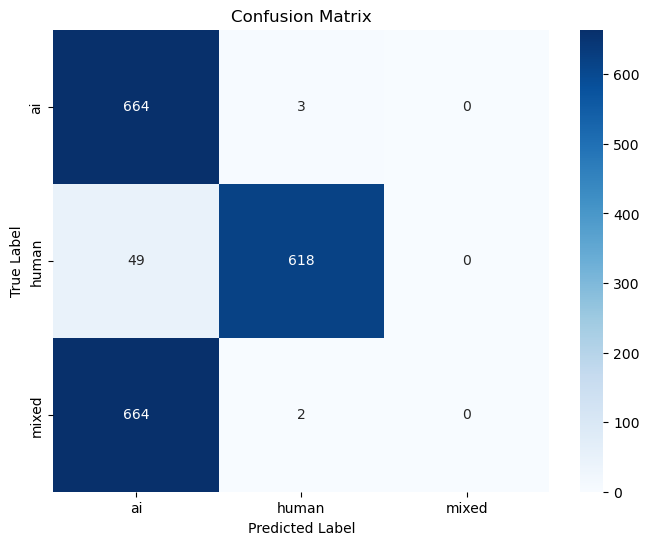

Classification Report:
              precision    recall  f1-score   support

          ai       0.48      1.00      0.65       667
       human       0.99      0.93      0.96       667
       mixed       0.00      0.00      0.00       666

    accuracy                           0.64      2000
   macro avg       0.49      0.64      0.54      2000
weighted avg       0.49      0.64      0.54      2000


Key Performance Metrics:
Accuracy:            0.6410

--- Macro Average ---
Precision (Macro):   0.4914
Recall (Macro):      0.6407
F1-Score (Macro):    0.5359

--- Micro Average ---
Precision (Micro):   0.6410
Recall (Micro):      0.6410
F1-Score (Micro):    0.6410

--- Weighted Average ---
Precision (Weighted): 0.4916
Recall (Weighted):    0.6410
F1-Score (Weighted):  0.5362

这是一个 3-分类问题
对于多分类问题，建议关注 Macro 或 Weighted 平均指标


{'confusion_matrix': array([[664,   3,   0],
        [ 49, 618,   0],
        [664,   2,   0]], dtype=int64),
 'accuracy': 0.641,
 'precision_macro': 0.4913940052369956,
 'recall_macro': 0.6406796601699151,
 'f1_macro': 0.5359486642697856,
 'precision_micro': 0.641,
 'recall_micro': 0.641,
 'f1_micro': 0.641,
 'precision_weighted': 0.49163970223961406,
 'recall_weighted': 0.641,
 'f1_weighted': 0.5362166386019205,
 'n_classes': 3,
 'classes': ['ai', 'human', 'mixed']}

In [18]:
evaluate_classification(df,'predicted_class','true_label')

In [40]:
import ast
import pandas as pd
import numpy as np

# 定义您想保留的其他列
columns_to_keep = ['true_label']  # 根据您的实际列名调整

expanded_rows = []

for i, row in df.iterrows():
    try:
        sentences = ast.literal_eval(row['sentences'])
    except Exception:
        continue
    
    if not isinstance(sentences, list):
        continue
    
    for j, s in enumerate(sentences):
        new_row = {
            "doc_index": i,
            "sentence_index": j,
            "sentence": s.get("sentence", ""),
            "generated_prob": float(s.get("generated_prob", np.nan)),
            "perplexity": float(s.get("perplexity", np.nan)),
            "human_prob": float(s.get("class_probabilities", {}).get("human", np.nan)),
            "ai_prob": float(s.get("class_probabilities", {}).get("ai", np.nan)),
            "char_len": len(s.get("sentence", "")),
            "word_count": len(s.get("sentence", "").split())
        }
        
        # 添加所有需要保留的列
        for col in columns_to_keep:
            if col in row:
                new_row[col] = row[col]
        
        expanded_rows.append(new_row)

sent_df = pd.DataFrame(expanded_rows)

print(sent_df.head())
print(f"\n数据形状: {sent_df.shape}")
print(f"true_label 分布:\n{sent_df['true_label'].value_counts()}")

   doc_index  sentence_index  \
0          0               0   
1          0               1   
2          0               2   
3          0               3   
4          0               4   

                                            sentence  generated_prob  \
0                                 公司发布年度业绩预增公告，表现亮眼。        0.999793   
1         预计全年实现归母净利润亿元，同比增长；其中第四季度单季实现归母净利润亿元，同比增长。        0.999800   
2       按预测中枢计算，年预计实现归母净利润亿元，同比增长；Q预计实现归母净利润亿元，同比增长。        0.999773   
3                             加速推进智能制造升级，产能利用率持续优化。）        0.999768   
4  智能工厂建设成效显著：Q新增条自动化生产线，整体产能提升，单位生产成本同比下降；）数字化管理...        0.999806   

   perplexity  human_prob   ai_prob  char_len  word_count true_label  
0         0.0    0.000207  0.999793        18           1         ai  
1         0.0    0.000200  0.999800        42           1         ai  
2         0.0    0.000227  0.999773        44           1         ai  
3         0.0    0.000232  0.999768        22           1         ai  
4         0.0    0.

In [41]:
sent_df

,doc_index,sentence_index,sentence,generated_prob,perplexity,human_prob,ai_prob,char_len,word_count,true_label
0,0,0,公司发布年度业绩预增公告，表现亮眼。,0.999793,0.0,0.000207,0.999793,18,1,ai
1,0,1,预计全年实现归母净利润亿元，同比增长；其中第四季度单季实现归母净利润亿元，同比增长。,0.999800,0.0,0.000200,0.999800,42,1,ai
2,0,2,按预测中枢计算，年预计实现归母净利润亿元，同比增长；Q预计实现归母净利润亿元，同比增长。,0.999773,0.0,0.000227,0.999773,44,1,ai
3,0,3,加速推进智能制造升级，产能利用率持续优化。）,0.999768,0.0,0.000232,0.999768,22,1,ai
4,0,4,智能工厂建设成效显著：Q新增条自动化生产线，整体产能提升，单位生产成本同比下降；）数字化管理...,0.999806,0.0,0.000194,0.999806,81,1,ai
...,...,...,...,...,...,...,...,...,...,...
41848,1999,22,下调盈利预测，下调至“增持”评级。,0.015785,0.0,0.984215,0.015785,17,1,human
41849,1999,23,下调对 年归母净利润的预测至 亿元（考虑到大客户订单波动），原预测值为 亿元；新增 年归母净...,0.016530,0.0,0.983470,0.016530,110,9,human
41850,1999,24,看好精研在MIM折叠屏等领域和核心竞争力，下调至“增持”评级。_,0.018405,0.0,0.981595,0.018405,32,1,human
41851,1999,25,D_,0.017309,0.0,0.982691,0.017309,2,1,human


In [60]:
df['constant_size'] = 3  # 创建一个常数列，值为3

fig = px.scatter_3d(df, 
                    x='word_count', 
                    y='confidence_score', 
                    z='average_generated_prob',
                    color='true_label',
                    size='constant_size',   # 使用常数列
                    size_max=10,             # 设置最大大小，因为只有一个大小，所以就是3
                    title='Length vs Confidence Score vs AI Probability (by True Label)',
                    labels={
                        'word_count': 'Word Count',
                        'confidence_score': 'Confidence Score', 
                        'average_generated_prob': 'AI Prob',
                        'true_label': 'True Label'
                    },
                    opacity=0.7)

fig.show()

In [59]:
sent_df.head()

,doc_index,sentence_index,sentence,generated_prob,perplexity,human_prob,ai_prob,char_len,word_count,true_label
0,0,0,公司发布年度业绩预增公告，表现亮眼。,0.999793,0.0,0.000207,0.999793,18,1,ai
1,0,1,预计全年实现归母净利润亿元，同比增长；其中第四季度单季实现归母净利润亿元，同比增长。,0.999800,0.0,0.000200,0.999800,42,1,ai
2,0,2,按预测中枢计算，年预计实现归母净利润亿元，同比增长；Q预计实现归母净利润亿元，同比增长。,0.999773,0.0,0.000227,0.999773,44,1,ai
3,0,3,加速推进智能制造升级，产能利用率持续优化。）,0.999768,0.0,0.000232,0.999768,22,1,ai
4,0,4,智能工厂建设成效显著：Q新增条自动化生产线，整体产能提升，单位生产成本同比下降；）数字化管理...,0.999806,0.0,0.000194,0.999806,81,1,ai
